<a href="https://colab.research.google.com/github/Gilade98/Machine_Learning_Projects/blob/main/The_DS_Toolbox/Ex3_BigData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Homework Assignment 3

Using the [Seattle Library Collection Inventory Dataset](https://www.kaggle.com/city-of-seattle/seattle-library-collection-inventory#library-collection-inventory.csv) and Vaex please, answer the following questions:

Important Note: **You can use a reltaviely small subset of the big dataset.**

**Question 1:** Using Vaex, write a function that returns the most popular book in each subject. Use it to find the most popular book in
    the _Mystery Fiction_ subject (15pt)

In [ ]:
# see more details in the course first lecture
!mkdir /root/.kaggle/
import json
import os

# Installing the Kaggle package
!pip install kaggle
!chmod 600 /root/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle/’: File exists


In [ ]:
# Creating a dataset directory

!mkdir ./datasets
!mkdir ./datasets/library-collection

# download the dataset from Kaggle and unzip it
!kaggle datasets download city-of-seattle/seattle-library-collection-inventory  -f library-collection-inventory.csv -p ./datasets/library-collection/
!unzip ./datasets/library-collection/*.zip  -d ./datasets/library-collection
!ls ./datasets/library-collection

Dataset URL: https://www.kaggle.com/datasets/city-of-seattle/seattle-library-collection-inventory
License(s): CC0-1.0
100% 3.77G/3.77G [02:55<00:00, 24.0MB/s]
100% 3.77G/3.77G [02:55<00:00, 23.0MB/s]
100% 3.77G/3.77G [02:55<00:00, 24.0MB/s]
100% 3.77G/3.77G [02:55<00:00, 23.0MB/s]
Archive:  ./datasets/library-collection/library-collection-inventory.csv.zip
  inflating: ./datasets/library-collection/library-collection-inventory.csv  Archive:  ./datasets/library-collection/library-collection-inventory.csv.zip
  inflating: ./datasets/library-collection/library-collection-inventory.csv  

library-collection-inventory.csv  library-collection-inventory.csv.zip
library-collection-inventory.csv  library-collection-inventory.csv.zip


In [ ]:
!pip install vaex

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 72.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 82.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.1/442.1 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 72.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 60.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import vaex
df = vaex.from_csv("/content/datasets/library-collection/library-collection-inventory.csv", nrows=1000000)
df

#,BibNum,Title,Author,ISBN,PublicationYear,Publisher,Subjects,ItemType,ItemCollection,FloatingItem,ItemLocation,ReportDate,ItemCount
0,3011076,"""A tale of two friends / adapted by Ellie O'Ryan...","O'Ryan, Ellie","'1481425730, 1481425749, 9781481425735, 97814814...",2014.,"Simon Spotlight,","'Musicians Fiction, Bullfighters Fiction, Best f...",jcbk,ncrdr,Floating,qna,2017-09-01T00:00:00.000,1
1,2248846,"'Naruto. Vol. 1, Uzumaki Naruto / story and art ...","Kishimoto, Masashi, 1974-",1569319006,"2003, c1999.","Viz,","'Ninja Japan Comic books strips etc, Comic books...",acbk,nycomic,--,lcy,2017-09-01T00:00:00.000,1
2,3209270,"'Peace, love & Wi-Fi : a ZITS treasury / by Jerr...","Scott, Jerry, 1955-","144945867X, 9781449458676",2014.,"Andrews McMeel Publishing,",'Duncan Jeremy Fictitious character Comic books ...,acbk,nycomic,--,bea,2017-09-01T00:00:00.000,1
3,1907265,The Paris pilgrims : a novel / Clancy Carlile.,"Carlile, Clancy, 1930-",0786706155,c1999.,"Carroll & Graf,","'Hemingway Ernest 1899 1961 Fiction, Biographica...",acbk,cafic,--,cen,2017-09-01T00:00:00.000,1
4,1644616,"'Erotic by nature : a celebration of life, of lo...",--,094020813X,"1991, c1988.","Red Alder Books/Down There Press,","'Erotic literature American, American literature...",acbk,canf,--,cen,2017-09-01T00:00:00.000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
"999,995",291274,"'The collected letters of Joseph Conrad. Vol.1, ...","Conrad, Joseph, 1857-1924","0521242169, 9780521242165",1983.,"Cambridge University Press,","'Conrad Joseph 1857 1924 Correspondence, Novelis...",acbk,cab,--,cen,2017-09-01T00:00:00.000,1
"999,996",1780323,'My scrapbook of collections and recollections /...,"Bingham, Helen, active 1972.",--,c1972.,"H. Bingham,","'De Kalb County Ill Biography, De Kalb County Il...",arbk,caref,--,cen,2017-09-01T00:00:00.000,1
"999,997",2902285,'Botticelli / Federico Poletti ; [translated by ...,"Poletti, Federico","3791346180, 9783791346182",2011.,"Prestel,",Botticelli Sandro 1444 or 1445 1510,acbk,nanf,--,bal,2017-09-01T00:00:00.000,1
"999,998",3283427,'Nothing but waves and wind / Christine Montalbe...,"Montalbetti, Christine,","1943150184, 9781943150182",2017.,"Dalkey Archive Press,","'Bars Drinking establishments Fiction, Oregon Fi...",acbk,cafic,--,cen,2017-09-01T00:00:00.000,1


In [ ]:
df_subjs=df["BibNum" , "Subjects"].dropna()
df_subjs

#,BibNum,Subjects
0,3011076,"'Musicians Fiction, Bullfighters Fiction, Best f..."
1,2248846,"'Ninja Japan Comic books strips etc, Comic books..."
2,3209270,'Duncan Jeremy Fictitious character Comic books ...
3,1907265,"'Hemingway Ernest 1899 1961 Fiction, Biographica..."
4,1644616,"'Erotic literature American, American literature..."
...,...,...
"975,487",291274,"'Conrad Joseph 1857 1924 Correspondence, Novelis..."
"975,488",1780323,"'De Kalb County Ill Biography, De Kalb County Il..."
"975,489",2902285,Botticelli Sandro 1444 or 1445 1510
"975,490",3283427,"'Bars Drinking establishments Fiction, Oregon Fi..."


In [ ]:
import numpy as np

bibnums = []
subjects = []

# Convert the columns to NumPy arrays
bibnum_array = df_subjs['BibNum'].values
subjects_array = df_subjs['Subjects'].values

# Use NumPy to process each row
for bibnum, subject_string in zip(bibnum_array, subjects_array):
    subject_list = subject_string.as_py().split(',')  # Split the string into a list of subjects
    subject_list = [subject.strip().lower() for subject in subject_list]  # Normalize each subject: strip spaces and convert to lowercase
    bibnums.extend([bibnum] * len(subject_list))  # Repeat the bibnum for each subject
    subjects.extend(subject_list)  # Add each subject

# Create a new Vaex DataFrame
df_flattened = vaex.from_arrays(
    bibnum=np.array(bibnums),
    subjects=np.array(subjects)
)

df_flattened

#,bibnum,subjects
0,3011076,musicians fiction
1,3011076,bullfighters fiction
2,3011076,best friends fiction
3,3011076,friendship fiction
4,3011076,adventure and adventurers fiction
...,...,...
"3,912,413",3283427,oregon fiction
"3,912,414",3110655,animals juvenile literature
"3,912,415",3110655,childrens questions and answers
"3,912,416",3110655,animals


In [ ]:
df_counts = df_flattened.groupby(['subjects', 'bibnum'], agg={'count': vaex.agg.count()}).sort(['subjects', 'count'], ascending=[True, False])
df_counts

#,subjects,bibnum,count
0,1 800 flowers firm,1796129,1
1,101 ranch historic district okla biography,1875462,1
2,101 ranch historic district okla history,1875462,1
3,16 and pregnant television program,3042718,3
4,'16 and pregnant television program juvenile lit...,2844568,4
...,...,...,...
"1,560,185",€etin fethiye family,2633774,1
"1,560,186",™sterreichische nationalbibliothek,2086162,1
"1,560,187",™sterreichische nationalbibliothek,394666,1
"1,560,188",™sterreichische nationalbibliothek catalogs,75724,1


In [ ]:
most_popular = df_counts.groupby('subjects', agg={'most_popular_bibnum': vaex.agg.first('bibnum')})
most_popular['subjects'] = most_popular['subjects'].str.strip().str.lower()
most_popular

#,subjects,most_popular_bibnum
0,'4e arrondissement paris france social life and ...,1608098
1,60 minutes television program drama,3160549
2,aardsma betsy ruth 1947 1969,3023380
3,aaron hank 1934 juvenile literature,2691221
4,aaronson family,3209926
...,...,...
"390,040",zweig stefanie fiction,3003672
"390,041",zydeco music drama,2301733
"390,042",z balo ecuador environmental conditions,1663435
"390,043",cole de paris,499495


In [ ]:
mystery_fiction_popular = most_popular[most_popular['subjects'] == 'mystery fiction']
mystery_fiction_popular

#,subjects,most_popular_bibnum
0,mystery fiction,3092975


In [ ]:
#Sanity check
mystery_fiction_df = df_counts[df_counts['subjects'] == 'mystery fiction']
mystery_fiction_df

#,subjects,bibnum,count
0,mystery fiction,3092975,22
1,mystery fiction,3137080,21
2,mystery fiction,3170894,21
3,mystery fiction,3038254,21
4,mystery fiction,3198495,20
...,...,...,...
"11,724",mystery fiction,3046526,1
"11,725",mystery fiction,2900828,1
"11,726",mystery fiction,2320323,1
"11,727",mystery fiction,2568980,1


**Question 2**: Using Vaex, find the top-10 fiction subjects (5pt), and use Seaborn to visualize the number of items over time for each subject (15pt)
    

In [ ]:
import re
import numpy as np
df3 = df['BibNum','Subjects','PublicationYear'].dropna()

# Define the regex pattern and function
r = re.compile('(\\d{4})')

def get_year(y_str, re_year=r):
    if y_str is None or type(y_str) != str:
        return None
    l = re_year.findall(y_str)  # take the first year
    if len(l) == 0 or l[0] is None or l[0] == "":
        return None
    return l[0]
df3['Year'] = df3["PublicationYear"].apply(lambda y: get_year(y, r) )
df3


#,BibNum,Subjects,PublicationYear,Year
0,3011076,"'Musicians Fiction, Bullfighters Fiction, Best f...",2014.,2014
1,2248846,"'Ninja Japan Comic books strips etc, Comic books...","2003, c1999.",2003
2,3209270,'Duncan Jeremy Fictitious character Comic books ...,2014.,2014
3,1907265,"'Hemingway Ernest 1899 1961 Fiction, Biographica...",c1999.,1999
4,1644616,"'Erotic literature American, American literature...","1991, c1988.",1991
...,...,...,...,...
"969,807",291274,"'Conrad Joseph 1857 1924 Correspondence, Novelis...",1983.,1983
"969,808",1780323,"'De Kalb County Ill Biography, De Kalb County Il...",c1972.,1972
"969,809",2902285,Botticelli Sandro 1444 or 1445 1510,2011.,2011
"969,810",3283427,"'Bars Drinking establishments Fiction, Oregon Fi...",2017.,2017


In [ ]:
bibnums = []
subjects = []
years = []

# Convert the columns to NumPy arrays
bibnum_array = df3['BibNum'].values
subjects_array = df3['Subjects'].values
year_array = df3['Year'].values

# Use NumPy to process each row
for bibnum, subject_string, year in zip(bibnum_array, subjects_array, year_array):
    subject_list = subject_string.as_py().split(',')  # Split the string into a list of subjects
    subject_list = [subject.strip().lower() for subject in subject_list]  # Normalize each subject: strip spaces and convert to lowercase
    normalized_year = get_year(year,r)
    bibnums.extend([bibnum] * len(subject_list))  # Repeat the bibnum for each subject
    subjects.extend(subject_list)  # Add each subject
    years.extend([normalized_year] * len(subject_list))

# Create a new Vaex DataFrame
df_year_subject = vaex.from_arrays(
    bibnum=np.array(bibnums),
    subjects=np.array(subjects),
    year=np.array(years)
)

df_year_subject

#,bibnum,subjects,year
0,3011076,musicians fiction,2014
1,3011076,bullfighters fiction,2014
2,3011076,best friends fiction,2014
3,3011076,friendship fiction,2014
4,3011076,adventure and adventurers fiction,2014
...,...,...,...
"3,900,743",3283427,oregon fiction,2017
"3,900,744",3110655,animals juvenile literature,2013
"3,900,745",3110655,childrens questions and answers,2013
"3,900,746",3110655,animals,2013


In [ ]:
df_fiction = df_year_subject[df_year_subject['subjects'].str.contains('fiction')]
df_fiction_counts = df_fiction.groupby('subjects', agg={'count': vaex.agg.count()})
df_fiction_counts_sorted = df_fiction_counts.sort('count', ascending=False)
top_10_fiction= df_fiction_counts_sorted.head(10)
top_10_fiction

#,subjects,count
0,fiction films,34858
1,mystery fiction,27159
2,historical fiction,19736
3,fiction television programs,18692
4,friendship fiction,17673
5,fantasy fiction,17293
6,suspense fiction,14402
7,schools fiction,13250
8,science fiction,11930
9,murder investigation fiction,11794


In [ ]:
df_year_subject['year'] = df_year_subject['year'].astype('int32')
df_filtered = df_year_subject[(df_year_subject['year'] >= 1300) & (df_year_subject['year'] <= 2100)] #limiting the years
df_aggregated = df_filtered.groupby(['year', 'subjects'], agg={'count': vaex.agg.count()})
df_top_10_ffictions_year = df_aggregated[df_aggregated['subjects'].isin(top_10_fiction['subjects'])]
df_top_10_ffictions_year

#,year,subjects,count
0,2014,fiction films,3876
1,2010,fantasy fiction,839
2,2009,suspense fiction,425
3,2009,fiction television programs,774
4,2001,fiction films,400
...,...,...,...
421,1966,mystery fiction,3
422,1990,friendship fiction,4
423,1977,schools fiction,1
424,1978,historical fiction,1


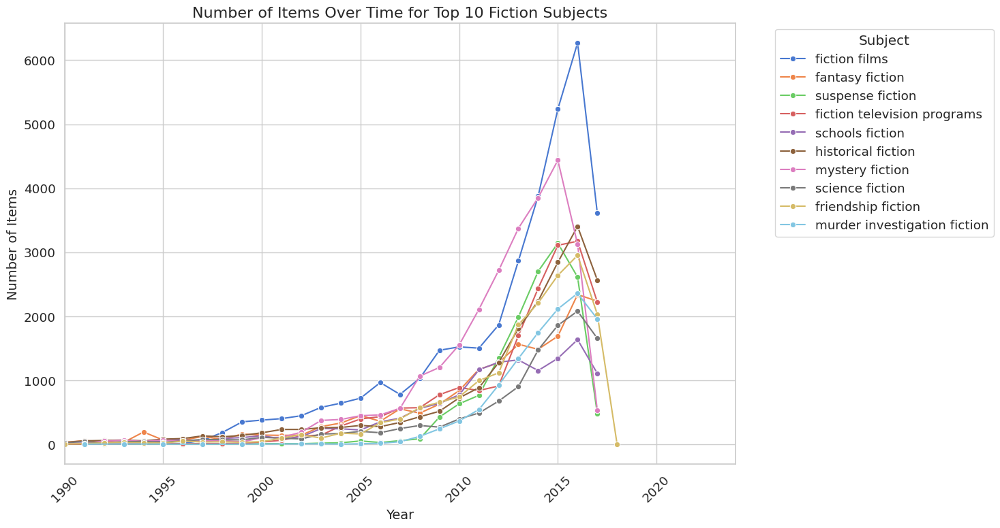

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", palette="muted", font_scale=1.2)

plt.figure(figsize=(15, 8))  # Set the figure size

# Create the line plot: 'year' on x-axis, 'count' on y-axis, and differentiate lines by 'subject'
sns.lineplot(data=df_top_10_ffictions_year.to_pandas_df(), x='year', y='count', hue='subjects', marker='o')

plt.title('Number of Items Over Time for Top 10 Fiction Subjects', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Items', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Subject', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside the plot

plt.tight_layout()
plt.xlim(1990,2024)
plt.show()

**Question 3:** Using Vaex, write a function that gets as input a subject name. The function returns the top-20 most _popular_ authors for the input subject (15pt).



In [ ]:
df_authors = df['BibNum', 'Subjects', 'Author'].dropna()
df_authors

#,BibNum,Subjects,Author
0,3011076,"'Musicians Fiction, Bullfighters Fiction, Best f...","O'Ryan, Ellie"
1,2248846,"'Ninja Japan Comic books strips etc, Comic books...","Kishimoto, Masashi, 1974-"
2,3209270,'Duncan Jeremy Fictitious character Comic books ...,"Scott, Jerry, 1955-"
3,1907265,"'Hemingway Ernest 1899 1961 Fiction, Biographica...","Carlile, Clancy, 1930-"
4,3270562,"'Man woman relationships Fiction, Betrothal Fict...","London, Julia"
...,...,...,...
"823,385",2583501,"Amber, Amber art objects","Hopp, Nancy P. S."
"823,386",291274,"'Conrad Joseph 1857 1924 Correspondence, Novelis...","Conrad, Joseph, 1857-1924"
"823,387",1780323,"'De Kalb County Ill Biography, De Kalb County Il...","Bingham, Helen, active 1972."
"823,388",2902285,Botticelli Sandro 1444 or 1445 1510,"Poletti, Federico"


In [ ]:
import numpy as np

bibnums = []
subjects = []
authors = []

# Convert the columns to NumPy arrays
bibnum_array = df_authors['BibNum'].values
subjects_array = df_authors['Subjects'].values
author_array = df_authors['Author'].values

# Use NumPy to process each row
for bibnum, subject_string, author in zip(bibnum_array, subjects_array, author_array):
    subject_list = subject_string.as_py().split(',')  # Split the string into a list of subjects
    subject_list = [subject.strip().lower() for subject in subject_list]  # Normalize each subject: strip spaces and convert to lowercase
    author_string = author.as_py().split(',')[0].strip().lower()
    bibnums.extend([bibnum] * len(subject_list))  # Repeat the bibnum for each subject
    subjects.extend(subject_list)  # Add each subject
    authors.extend([author_string] * len(subject_list))

# Create a new Vaex DataFrame
df_author_subject = vaex.from_arrays(
    bibnum=np.array(bibnums),
    subjects=np.array(subjects),
    author=np.array(authors)
)

df_author_subject

#,bibnum,subjects,author
0,3011076,musicians fiction,o'ryan
1,3011076,bullfighters fiction,o'ryan
2,3011076,best friends fiction,o'ryan
3,3011076,friendship fiction,o'ryan
4,3011076,adventure and adventurers fiction,o'ryan
...,...,...,...
"3,106,681",1780323,de kalb county ill biography,bingham
"3,106,682",1780323,de kalb county ill history,bingham
"3,106,683",2902285,botticelli sandro 1444 or 1445 1510,poletti
"3,106,684",3283427,bars drinking establishments fiction,montalbetti


In [ ]:
def top_20_authors_for_subject(df, subject_name):
    subject_name = subject_name.strip().lower()
    filtered_df = df[df['subjects'].str.contains(subject_name)]
    author_counts = filtered_df.groupby('author', agg={'count': vaex.agg.count()})
    top_authors = author_counts.sort(by='count', ascending=False).head(20)
    return top_authors
top_20_authors_for_subject(df_author_subject, 'fiction')

#,author,count
0,patterson,9628
1,meadows,8932
2,stilton,8209
3,smith,5940
4,brown,5907
...,...,...
15,taylor,2900
16,morgan,2897
17,lee,2876
18,russell,2822


Using the [The Blog Authorship Corpus](https://www.kaggle.com/datasets/rtatman/blog-authorship-corpus) and Vaex, please answer the following questions:

**Question 4:** Calculate the average and median age of bloggers in each topic by gender(5pt).
Calculate the average and median age of bloggers according to their sign (5pt).
Visualize the age distributions  of bloggers according to their  topic and gender using Seaborn and PlotlyExpress(15pt)

In [ ]:
!kaggle datasets list -s "Blog Authorship Corpus"

ref                                                   title                                 size  lastUpdated          downloadCount  voteCount  usabilityRating  
----------------------------------------------------  -----------------------------------  -----  -------------------  -------------  ---------  ---------------  
rtatman/blog-authorship-corpus                        Blog Authorship Corpus               290MB  2017-08-15 21:20:54          13134        143  0.8235294        
endofnight17j03/blog-authorship-corpus                Blog Authorship Corpus               290MB  2024-06-07 12:43:13              6          7  0.29411766       
saurabhbagchi/sample-blog-corpus                      Sample Blog Corpus                   290MB  2021-02-28 12:20:26            403         13  1.0              
jayabharathihari/blogtext-digital-content-management  blogtext Digital content management  290MB  2024-04-30 18:11:45              2          0  0.5294118        


In [ ]:
!mkdir ./datasets/blog-corpus
!kaggle datasets files rtatman/blog-authorship-corpus

name           size  creationDate         
------------  -----  -------------------  
blogtext.csv  763MB  2019-09-20 22:32:49  


In [ ]:
!kaggle datasets download rtatman/blog-authorship-corpus -f blogtext.csv -p ./datasets/blog-corpus
!unzip ./datasets/blog-corpus/*.zip  -d ./datasets/blog-corpus
!ls ./datasets/blog-corpus

Dataset URL: https://www.kaggle.com/datasets/rtatman/blog-authorship-corpus
License(s): other
 99% 287M/290M [00:16<00:00, 21.2MB/s]
100% 290M/290M [00:16<00:00, 18.6MB/s]
Archive:  ./datasets/blog-corpus/blogtext.csv.zip
  inflating: ./datasets/blog-corpus/blogtext.csv  
blogtext.csv  blogtext.csv.zip


In [ ]:
import vaex
blogs_df = vaex.from_csv("/content/datasets/blog-corpus/blogtext.csv")
blogs_df

#,id,gender,age,topic,sign,date,text
0,2059027,male,15,Student,Leo,"14,May,2004","' Info has been found (+/- 100 pages, ..."
1,2059027,male,15,Student,Leo,"13,May,2004",' These are the team members: Drewes...
2,2059027,male,15,Student,Leo,"12,May,2004",' In het kader van kernfusie op aarde:...
3,2059027,male,15,Student,Leo,"12,May,2004",testing!!! testing!!!
4,3581210,male,33,InvestmentBanking,Aquarius,"11,June,2004",""" Thanks to Yahoo!'s Toolbar I can n..."
...,...,...,...,...,...,...,...
"681,279",1713845,male,23,Student,Taurus,"01,July,2004","' Dear Susan, I could write some really b..."
"681,280",1713845,male,23,Student,Taurus,"01,July,2004",""" Dear Susan, 'I have the second yeast in..."
"681,281",1713845,male,23,Student,Taurus,"01,July,2004",""" Dear Susan, Your 'boyfriend' is fucking..."
"681,282",1713845,male,23,Student,Taurus,"01,July,2004","' Dear Susan: Just to clarify, I am ask..."


In [ ]:
age_topic_gender_df= blogs_df['id','age', 'topic', 'gender'].dropna()
age_topic_gender_df

#,id,age,topic,gender
0,2059027,15,Student,male
1,2059027,15,Student,male
2,2059027,15,Student,male
3,2059027,15,Student,male
4,3581210,33,InvestmentBanking,male
...,...,...,...,...
"681,279",1713845,23,Student,male
"681,280",1713845,23,Student,male
"681,281",1713845,23,Student,male
"681,282",1713845,23,Student,male


In [ ]:
age_topic_gender_average = age_topic_gender_df.groupby(['topic', 'gender'], agg={
    'average_age': vaex.agg.mean('age')
}).to_pandas_df()

age_topic_gender_average

,topic,gender,average_age
0,Military,female,23.717005
1,Military,male,26.836325
2,RealEstate,female,25.811293
3,RealEstate,male,27.221129
4,Banking,female,27.491736
...,...,...,...
75,Marketing,male,29.697705
76,Arts,female,25.503351
77,Arts,male,24.611687
78,InvestmentBanking,female,25.207289


In [ ]:
# Export the data for calculating the median
age_topic_gender_df_sorted = age_topic_gender_df.sort(['topic', 'gender', 'age'])

# Convert to a pandas DataFrame for precise median calculations
age_topic_gender_df_sorted_pandas = age_topic_gender_df_sorted.to_pandas_df()

# Group by 'topic' and 'gender' and calculate median manually
median_result = age_topic_gender_df_sorted_pandas.groupby(['topic', 'gender'])['age'].median().reset_index()
median_result.rename(columns={'age': 'median_age'}, inplace=True)

# Combine average and median results
final_result = age_topic_gender_average.merge(median_result, on=['topic', 'gender'])
final_result

,topic,gender,average_age,median_age
0,Military,female,23.717005,23.0
1,Military,male,26.836325,24.0
2,RealEstate,female,25.811293,24.0
3,RealEstate,male,27.221129,30.0
4,Banking,female,27.491736,25.0
...,...,...,...,...
75,Marketing,male,29.697705,26.0
76,Arts,female,25.503351,24.0
77,Arts,male,24.611687,25.0
78,InvestmentBanking,female,25.207289,24.0


In [ ]:
age_sign_df= blogs_df['id','age','sign'].dropna()

age_sign_average = age_sign_df.groupby(['sign'], agg={
    'average_age': vaex.agg.mean('age')
}).to_pandas_df()
# Export the data for calculating the median
age_sign_df_sorted = age_sign_df.sort(['age']).to_pandas_df()

# Group by 'topic' and 'gender' and calculate median manually
median_result_sign = age_sign_df_sorted.groupby(['sign'])['age'].median().reset_index()
median_result_sign.rename(columns={'age': 'median_age'}, inplace=True)

# Combine average and median results
final_result_sign = age_sign_average.merge(median_result_sign, on=['sign'])
final_result_sign

,sign,average_age,median_age
0,Cancer,24.470437,25.0
1,Aquarius,23.537183,24.0
2,Capricorn,24.098392,24.0
3,Gemini,23.944195,24.0
4,Virgo,23.780642,24.0
5,Sagittarius,23.752478,24.0
6,Scorpio,23.634331,23.0
7,Taurus,23.455955,24.0
8,Libra,22.460738,24.0
9,Pisces,25.033319,24.0


Text(0, 0.5, 'Topic')

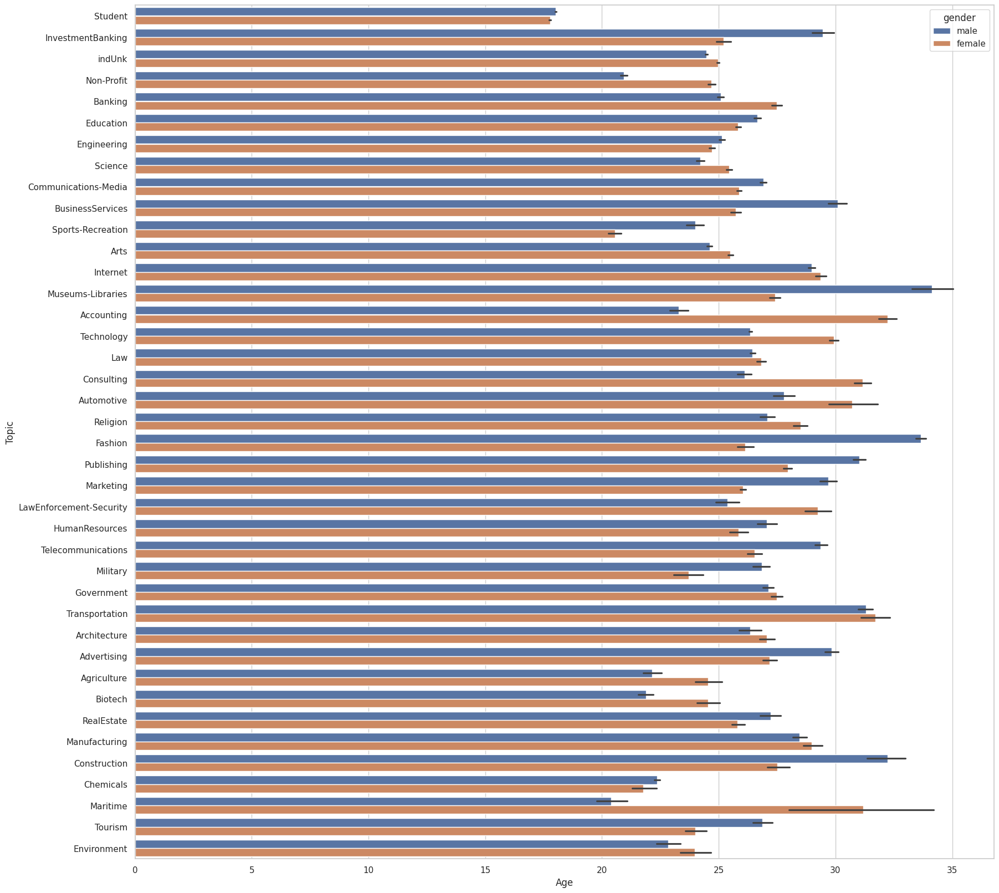

In [ ]:
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

sns.set_theme(style="whitegrid")

plt.figure(figsize = (20, 20), facecolor = None)
sns.set_color_codes("pastel")
sns.barplot(x="age", y="topic", hue ="gender", data=age_topic_gender_df.to_pandas_df())
plt.xlabel("Age")
plt.ylabel("Topic")

In [ ]:
fig = px.box(
    age_topic_gender_df.to_pandas_df(),
    x='topic',
    y='age',
    color='gender',
    title='Age Distribution by Topic and Gender',
    labels={'age':'Age', 'topic':'Topic', 'gender':'Gender'}
)
fig.show()

**Question 5:** Using the  [SJR Journal Ranking of 2018](https://www.scimagojr.com/journalrank.php) dataset and Seaborn, visualize
    the H-index distributions according to the SJR Best Quartile (15pt). Using a grid, visualize the _Cites / Doc. (2years)_ histograms values of each publisher (15pt).

**Note: You can use only the top publishers **
    


In [ ]:
import pandas as pd
sjr_2018_df = pd.read_csv('/content/datasets/scimagojr_2018.csv', sep=';')
sjr_2018_df.head()

<ipython-input-21-1fa3fecb8ad9>:2: DtypeWarning:

Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.



,Rank,Sourceid,Title,Type,Issn,SJR,SJR Best Quartile,H index,Total Docs. (2018),Total Docs. (3years),...,Ref. / Doc.,%Female,Overton,SDG,Country,Region,Publisher,Coverage,Categories,Areas
0,1,28773,Ca-A Cancer Journal for Clinicians,journal,"15424863, 00079235","72,576",Q1,211,41,123,...,"62,63","47,79",19,39,United States,Northern America,Wiley-Blackwell,1950-2023,Hematology (Q1); Oncology (Q1),Medicine
1,2,19434,MMWR Recommendations and Reports,journal,"10575987, 15458601","48,894",Q1,160,3,12,...,"186,33","55,56",3,3,United States,Northern America,Centers for Disease Control and Prevention (CDC),1990-2023,Epidemiology (Q1); Health Information Manageme...,Environmental Science; Health Professions; Med...
2,3,21100812243,Nature Reviews Materials,journal,20588437,"34,171",Q1,184,93,194,...,"82,71","19,43",4,13,United Kingdom,Western Europe,Nature Publishing Group,2016-2023,"Biomaterials (Q1); Electronic, Optical and Mag...",Energy; Materials Science
3,4,29431,Quarterly Journal of Economics,journal,"00335533, 15314650","30,490",Q1,306,40,119,...,"62,45","19,00",30,25,United Kingdom,Western Europe,Oxford University Press,1886-2023,Economics and Econometrics (Q1),"Economics, Econometrics and Finance"
4,5,18991,Nature Reviews Genetics,journal,"14710056, 14710064","30,428",Q1,421,114,384,...,"68,68","37,31",22,17,United Kingdom,Western Europe,Nature Publishing Group,2000-2023,Genetics (Q1); Genetics (clinical) (Q1); Molec...,"Biochemistry, Genetics and Molecular Biology; ..."


In [ ]:
sjr_best_h =sjr_2018_df[['SJR Best Quartile','H index']]
sjr_best_h.head()

,SJR Best Quartile,H index
0,Q1,211
1,Q1,160
2,Q1,184
3,Q1,306
4,Q1,421


In [ ]:
sjr_best_h = sjr_best_h.dropna(subset=['H index', 'SJR Best Quartile'])
sjr_best_h['SJR Best Quartile'] = sjr_best_h['SJR Best Quartile'].replace('-', 'Unknown')

<ipython-input-29-3bffa7420ddc>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




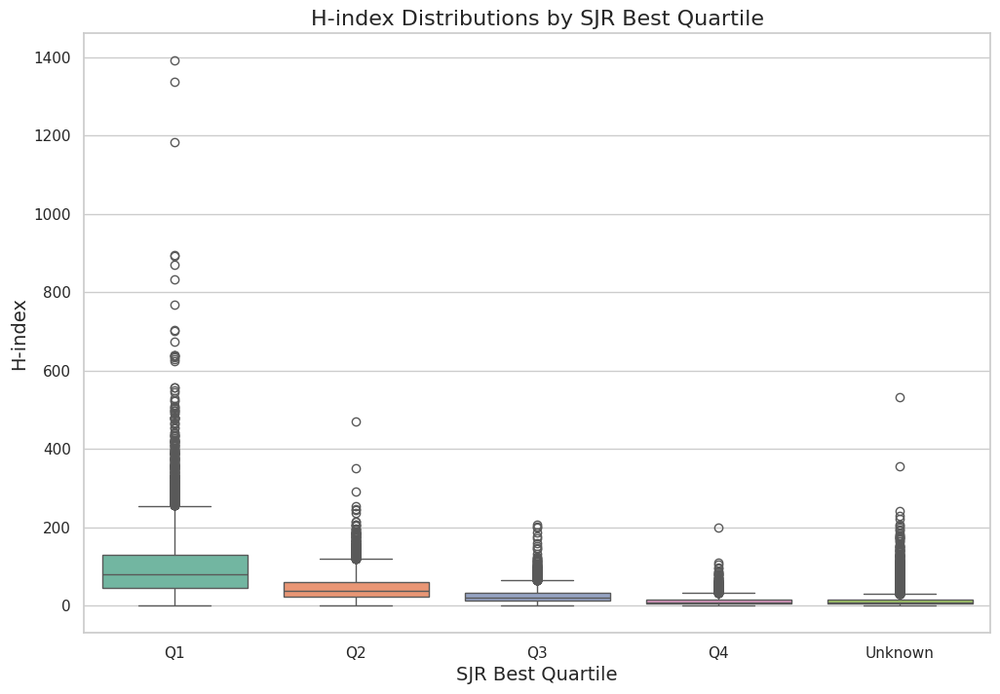

In [ ]:
sns.set_style('whitegrid')
quartile_categories = ['Q1', 'Q2', 'Q3', 'Q4', 'Unknown']
# Create the boxplot
plt.figure(figsize=(12, 8))
sns.boxplot(
    x='SJR Best Quartile',
    y='H index',
    data=sjr_best_h,
    order=quartile_categories,
    palette='Set2'
)
plt.title('H-index Distributions by SJR Best Quartile', fontsize=16)
plt.xlabel('SJR Best Quartile', fontsize=14)
plt.ylabel('H-index', fontsize=14)
plt.show()

In [ ]:
sjr_2018_df.columns

Index(['Rank', 'Sourceid', 'Title', 'Type', 'Issn', 'SJR', 'SJR Best Quartile',
       'H index', 'Total Docs. (2018)', 'Total Docs. (3years)', 'Total Refs.',
       'Total Cites (3years)', 'Citable Docs. (3years)',
       'Cites / Doc. (2years)', 'Ref. / Doc.', '%Female', 'Overton', 'SDG',
       'Country', 'Region', 'Publisher', 'Coverage', 'Categories', 'Areas'],
      dtype='object')

In [ ]:
sjr_pub_citedoc=sjr_2018_df[[ 'Publisher', 'Cites / Doc. (2years)']]
sjr_pub_citedoc.head()

,Publisher,Cites / Doc. (2years)
0,Wiley-Blackwell,"165,52"
1,Centers for Disease Control and Prevention (CDC),"96,88"
2,Nature Publishing Group,"38,42"
3,Oxford University Press,"12,90"
4,Nature Publishing Group,"17,99"


In [ ]:
sjr_pub_citedoc = sjr_pub_citedoc.dropna(subset=['Publisher', 'Cites / Doc. (2years)'])

In [ ]:
N = 10  # top 10 publishers
top_publishers = sjr_pub_citedoc['Publisher'].value_counts().head(N).index.tolist()
df_top_publishers = sjr_pub_citedoc[sjr_pub_citedoc['Publisher'].isin(top_publishers)]
print(top_publishers)

['Taylor and Francis Ltd.', 'Elsevier B.V.', 'Routledge', 'SAGE Publications Inc.', 'Wiley-Blackwell Publishing Ltd', 'Brill Academic Publishers', 'Emerald Group Publishing Ltd.', 'Elsevier Ltd', 'Oxford University Press', 'SAGE Publications Ltd']


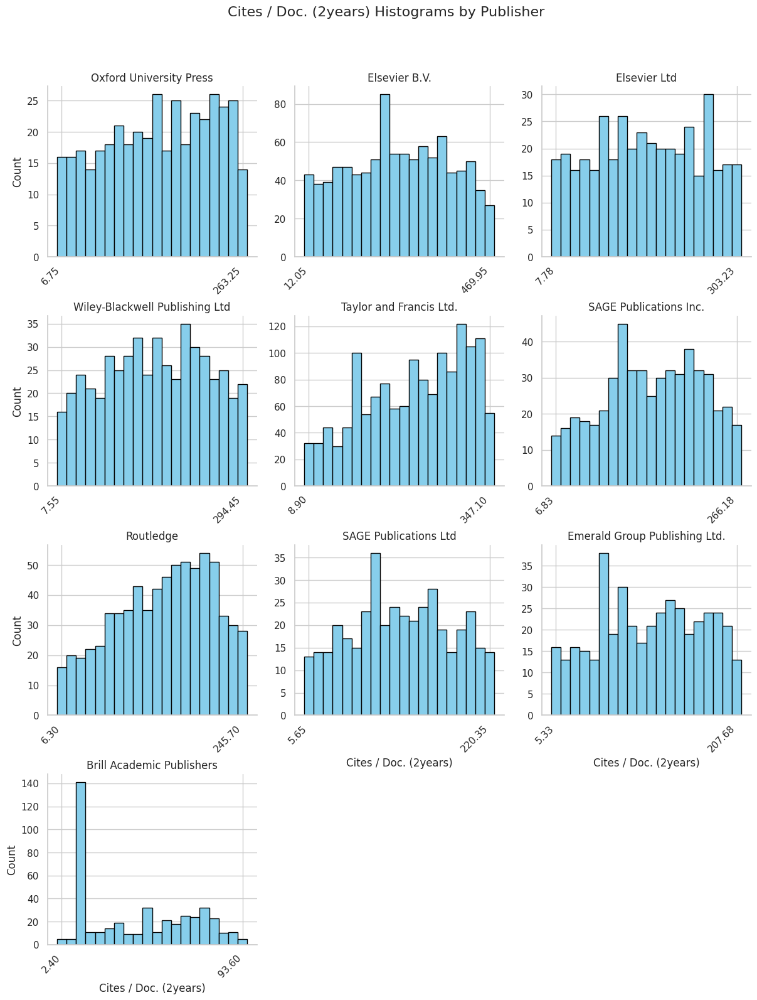

In [ ]:
sns.set_style('whitegrid')

# Create the FacetGrid
g = sns.FacetGrid(
    df_top_publishers,
    col='Publisher',
    col_wrap=3,
    sharex=False,
    sharey=False,
    height=4
)

# Define the custom histogram function
def custom_histogram(data, **kwargs):
    # Plot the histogram
    counts, bins, patches = plt.hist(
        data['Cites / Doc. (2years)'],
        bins=20,
        color='skyblue',
        edgecolor='black'
    )

    # Calculate the bin centers
    bin_centers = 0.5 * (bins[:-1] + bins[1:])

    # Get the first and last bin centers
    first_bin = bin_centers[0]
    last_bin = bin_centers[-1]

    # Set the x-ticks to the positions of the first and last bins
    plt.xticks(
        [first_bin, last_bin],
        [f"{first_bin:.2f}", f"{last_bin:.2f}"],
        rotation=45,
        ha='right'
    )

# Map the function to the FacetGrid
g.map_dataframe(custom_histogram)

# Set titles and labels
g.set_titles(col_template="{col_name}", size=12)
g.set_axis_labels('Cites / Doc. (2years)', 'Count')

# Adjust layout and add a main title
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Cites / Doc. (2years) Histograms by Publisher', fontsize=16)

# Show the plot
plt.show()
